In [2]:
import pandas as pd
import os 
import openai
from openai import OpenAI
import json

# Definición de la base de datos

In [3]:
# Lectura de la base de datos
bd = pd.read_csv('data/complete/comentarios.csv')

In [4]:
bd

,video_id,comment_id,Texto Comentario,likes,Tipo Comentaro,Nombre del Video,Link del Video,Fecha del Video,Nombre del noticiero,Query,País del Presidente,Tipo Noticiero,País del Medio,Nombre del Presidente
0,hUB9Bbmh58I,UgxzYxtFuT8DX5IahFR4AaABAg,"No hablo de socialismo, que falacias que sacan",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei
1,hUB9Bbmh58I,UgyMvKupk0keUaOWGeF4AaABAg,"Vé, una pregunta: ¿Cuando Petro habló de socia...",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei
2,hUB9Bbmh58I,Ugzn5x-8V0cPAng1oYF4AaABAg,no entiendo porque quieren seguir vendiendo la...,0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei
3,hUB9Bbmh58I,UgxXBXoLabae2Lb_vlB4AaABAg,"Selor Lucumi,Me gustaría aclarar que la postur...",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei
4,hUB9Bbmh58I,UgyLqVixbjXvEfZXKSR4AaABAg,JAJAJAJA ESE PETRO ES UN PAYASO...,0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
588500,KEUH4oKd1N0,Ugz9n49-qrnTLL-dhBF4AaABAg.A5SPkX9Z_ZlA5UtNbnraqw,"Será, por el teléfono o por el djdjwiwowbe ja...",1.0,reply,"Escándalo en Colombia: “Soy heterosexual”, dic...",https://www.youtube.com/watch?v=KEUH4oKd1N0,2024-07-04 01:15:01+00:00,Excélsior TV,Colombia Gustavo Petro presidente,México,Nacional,México,Andrés Manuel López Obrador
588501,KEUH4oKd1N0,Ugw9VVDlOJ_lj91JsBx4AaABAg,"Realidad de muchos, cogen hombres ricos pero s...",7.0,principal,"Escándalo en Colombia: “Soy heterosexual”, dic...",https://www.youtube.com/watch?v=KEUH4oKd1N0,2024-07-04 01:15:01+00:00,Excélsior TV,Colombia Gustavo Petro presidente,México,Nacional,México,Andrés Manuel López Obrador
588502,KEUH4oKd1N0,UgyEZZElbqo7A-024Jl4AaABAg,Un montaje totalmente Porque esos medios se va...,0.0,principal,"Escándalo en Colombia: “Soy heterosexual”, dic...",https://www.youtube.com/watch?v=KEUH4oKd1N0,2024-07-04 01:15:01+00:00,Excélsior TV,Colombia Gustavo Petro presidente,México,Nacional,México,Andrés Manuel López Obrador
588503,KEUH4oKd1N0,Ugw_EE7cruqg1axy0hl4AaABAg,Montaje.,4.0,principal,"Escándalo en Colombia: “Soy heterosexual”, dic...",https://www.youtube.com/watch?v=KEUH4oKd1N0,2024-07-04 01:15:01+00:00,Excélsior TV,Colombia Gustavo Petro presidente,México,Nacional,México,Andrés Manuel López Obrador


In [4]:
# contar la cantidad de caracteres en cada comentario 
bd['caracteres'] = bd['Texto Comentario'].apply(lambda x: len(x))

In [103]:
# sumar la cantidad de caracteres
total_caracteres = bd['caracteres'].sum()
total_caracteres

66422941

<Axes: >

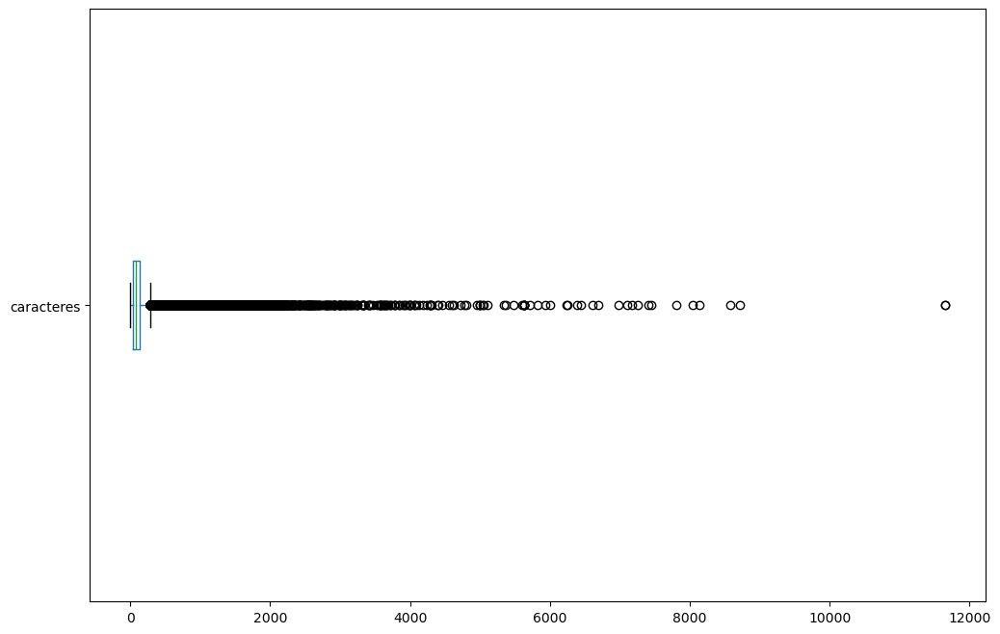

In [104]:
# hacer boxplot de la cantidad de caracteres en cada comentario, lindo y especifico
bd.boxplot(column='caracteres', grid=False, vert=False, figsize=(12, 8))

**Los ouliers son bastante prominentes**

In [5]:
# todos los cuartiles 
bd['caracteres'].describe()

count    588505.000000
mean        112.867250
std         155.537422
min           1.000000
25%          37.000000
50%          73.000000
75%         136.000000
max       11647.000000
Name: caracteres, dtype: float64

In [32]:
# mostrar el percentil 90
bd['caracteres'].quantile(0.975)

451.0

**Analizamos los comentarios con más de 1000 caracteres**

In [8]:
bd = bd[bd['caracteres'] < bd['caracteres'].quantile(0.975)]

In [9]:
bd['caracteres'].describe()

count    573783.000000
mean         96.281206
std          83.663293
min           1.000000
25%          36.000000
50%          71.000000
75%         129.000000
max         450.000000
Name: caracteres, dtype: float64

In [109]:
comments = bd["Texto Comentario"].tolist()

# Prueba de uso de batch API con los primeros 5000 comentarios

**A continuación una vista preeliminar de como funciona el procesamiento por lotes de la api de open ai** 

In [112]:
# Paso 1: Crear un archivo de entrada JSONL para el procesamiento por lotes
input_filename = 'input_comments.jsonl'

with open(input_filename, 'w') as jsonl_file:
    for i, comment in enumerate(comments, start=1):
        # Creando una solicitud para cada comentario
        request_data = {
            "custom_id": f"request-{i}",
            "method": "POST",
            "url": "/v1/chat/completions", # Modo para crear una unica respuesta del modelo
            "body": {
                "model": "gpt-4o-mini",
                "temperature": 0,
                "messages": [
                    {"role": "system", "content": "Como IA con experiencia en análisis de lenguaje y emociones, su tarea es analizar el sentimiento del siguiente texto. Considere el tono general de la discusión, la emoción transmitida por el lenguaje utilizado y el contexto en el que se utilizan las palabras y frases. Indique si el sentimiento es generalmente positivo, negativo o neutral y proporcione una etiqueta sin ningún texto adicional."},
                    {"role": "user", "content": comment}
                ],
            "max_tokens": 1000
            }
        }
        
        # Escribir la solicitud JSONL en el archivo
        jsonl_file.write(json.dumps(request_data) + '\n')

In [18]:
api_key = "API KEY"

In [114]:
# Se comprueba que el archivo se haya subido correctamente
batch_input_file

FileObject(id='file-fK5T3OtuVx6DnYxDB1vNRBYQ', bytes=2033160, created_at=1724631197, filename='input_comments.jsonl', object='file', purpose='batch', status='processed', status_details=None)

In [115]:
batch_input_file_id = batch_input_file.id

# crear un lote con los comentarios del archivo subido
client.batches.create(
    input_file_id=batch_input_file_id,
    endpoint="/v1/chat/completions", # # esto 
    completion_window="24h",
    metadata={
      "description": "prompt1.1"
    }
)

Batch(id='batch_wC2gP8qDVrNZrsheQ8krg8s4', completion_window='24h', created_at=1724631198, endpoint='/v1/chat/completions', input_file_id='file-fK5T3OtuVx6DnYxDB1vNRBYQ', object='batch', status='validating', cancelled_at=None, cancelling_at=None, completed_at=None, error_file_id=None, errors=None, expired_at=None, expires_at=1724717598, failed_at=None, finalizing_at=None, in_progress_at=None, metadata={'description': 'prompt1.1'}, output_file_id=None, request_counts=BatchRequestCounts(completed=0, failed=0, total=0))

In [163]:
# se obtienen los datos del lote, se espera a que se completo y el archivo de salida
client.batches.retrieve("batch_zHGY8aBr9K9VcwfeeMPAViEp")

Batch(id='batch_zHGY8aBr9K9VcwfeeMPAViEp', completion_window='24h', created_at=1724631016, endpoint='/v1/chat/completions', input_file_id='file-Pksaq6K0i2iNvdL1J2mnm8Et', object='batch', status='completed', cancelled_at=None, cancelling_at=None, completed_at=1724632714, error_file_id=None, errors=None, expired_at=None, expires_at=1724717416, failed_at=None, finalizing_at=1724632403, in_progress_at=1724631020, metadata={'description': 'prompt1.1'}, output_file_id='file-pK5qjoB99Db1FLLtcdfZfEKz', request_counts=BatchRequestCounts(completed=5000, failed=0, total=5000))

In [164]:
# se obtiene el archivo de salida por medio de su id por la salida anterior
file_response = client.files.content("file-pK5qjoB99Db1FLLtcdfZfEKz")
print(file_response.text)

{"id": "batch_req_8CdegS8DfnDYWGCkch95fFye", "custom_id": "request-1", "response": {"status_code": 200, "request_id": "7d6c8dad070fa5f2f8078e8b58144ace", "body": {"id": "chatcmpl-A0HbO2wqrcZ2WYkGHByx7AYB2Z48w", "object": "chat.completion", "created": 1724631026, "model": "gpt-4o-mini-2024-07-18", "choices": [{"index": 0, "message": {"role": "assistant", "content": "Negativo", "refusal": null}, "logprobs": null, "finish_reason": "stop"}], "usage": {"prompt_tokens": 97, "completion_tokens": 2, "total_tokens": 99}, "system_fingerprint": "fp_48196bc67a"}}, "error": null}
{"id": "batch_req_VBZTalChC9Jfi77PyRdGiM1k", "custom_id": "request-2", "response": {"status_code": 200, "request_id": "c2ad5bb3b657b90722c269e166c84895", "body": {"id": "chatcmpl-A0HbMOxu47PpcjL3Vm7dNEqNqwtDN", "object": "chat.completion", "created": 1724631024, "model": "gpt-4o-mini-2024-07-18", "choices": [{"index": 0, "message": {"role": "assistant", "content": "Neutral", "refusal": null}, "logprobs": null, "finish_reas

Los **completion_tokens** son a las unidades de texto generadas por un modelo de lenguaje, como ChatGPT, en respuesta a una solicitud o prompt. Puede ser un dato interesante a analizar.

**A continuación el procedimiento de extracción de la respuesta del token**

In [ ]:
# Leer el contenido del archivo como texto
file_content = file_response.text

# Convertir cada línea del archivo JSONL en un diccionario
lines = file_content.splitlines()
responses = [json.loads(line) for line in lines]

# Extraer la respuesta del asistente
assistant_responses = [response['response']['body']['choices'][0]['message']['content'] for response in responses]

# Crear un DataFrame con las respuestas en una columna
df_respuestas = pd.DataFrame(assistant_responses, columns=['respuesta'])

# Mostrar el DataFrame
print(df_respuestas)

**Se analiza si existen resultados nada para comprobar si esta funcionando correctamente**

In [177]:
# null values in df_respuestas
df_respuestas.isnull().sum()

respuesta    0
dtype: int64

In [193]:
# añadir las respuestas al dataframe bd
bd['respuesta'] = df_respuestas['respuesta']

In [192]:
bd['respuesta']

0       Negativo
1        Neutral
2       Negativo
3        Neutral
4       Negativo
          ...   
4995    Negativo
4996     Neutral
4997    Negativo
4998     Neutral
4999     Neutral
Name: respuesta, Length: 5000, dtype: object

In [183]:
bd = bd.head(5000)
    

In [194]:
bd

,video_id,comment_id,Texto Comentario,likes,Tipo Comentaro,Nombre del Video,Link del Video,Fecha del Video,Nombre del noticiero,Query,País del Presidente,Tipo Noticiero,País del Medio,Nombre del Presidente,caracteres,respuesta
0,hUB9Bbmh58I,UgxzYxtFuT8DX5IahFR4AaABAg,"No hablo de socialismo, que falacias que sacan",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,46,Negativo
1,hUB9Bbmh58I,UgyMvKupk0keUaOWGeF4AaABAg,"Vé, una pregunta: ¿Cuando Petro habló de socia...",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,55,Neutral
2,hUB9Bbmh58I,Ugzn5x-8V0cPAng1oYF4AaABAg,no entiendo porque quieren seguir vendiendo la...,0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,183,Negativo
3,hUB9Bbmh58I,UgxXBXoLabae2Lb_vlB4AaABAg,"Selor Lucumi,Me gustaría aclarar que la postur...",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,301,Neutral
4,hUB9Bbmh58I,UgyLqVixbjXvEfZXKSR4AaABAg,JAJAJAJA ESE PETRO ES UN PAYASO...,0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,34,Negativo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,SqSheFlXBeM,UgyUD5VAzBUH-bevmIl4AaABAg,El gobierno ecuatoriano como colombiano no pue...,4.0,principal,Si presos colombianos son expulsados de Ecuado...,https://www.youtube.com/watch?v=SqSheFlXBeM,2024-01-11 14:25:59+00:00,Telemundo,Colombia Gustavo Petro presidente,Colombia,Internacional,Internacional,Gustavo Petro,424,Negativo
4996,SqSheFlXBeM,UgyUD5VAzBUH-bevmIl4AaABAg.9zRbrXsCXf89zX123hclQa,cada gobierno es responsable de sus actos,0.0,reply,Si presos colombianos son expulsados de Ecuado...,https://www.youtube.com/watch?v=SqSheFlXBeM,2024-01-11 14:25:59+00:00,Telemundo,Colombia Gustavo Petro presidente,Colombia,Internacional,Internacional,Gustavo Petro,41,Neutral
4997,SqSheFlXBeM,UgxzhZWlXkPVbW-CK1V4AaABAg,Oe cojan a sus preso no hay comida para manten...,0.0,principal,Si presos colombianos son expulsados de Ecuado...,https://www.youtube.com/watch?v=SqSheFlXBeM,2024-01-11 14:25:59+00:00,Telemundo,Colombia Gustavo Petro presidente,Colombia,Internacional,Internacional,Gustavo Petro,87,Negativo
4998,SqSheFlXBeM,UgwYwQBU4_aXdiZv_Xl4AaABAg,El señor Osuna no es partidiario de aplicar cá...,0.0,principal,Si presos colombianos son expulsados de Ecuado...,https://www.youtube.com/watch?v=SqSheFlXBeM,2024-01-11 14:25:59+00:00,Telemundo,Colombia Gustavo Petro presidente,Colombia,Internacional,Internacional,Gustavo Petro,53,Neutral


<Axes: xlabel='respuesta'>

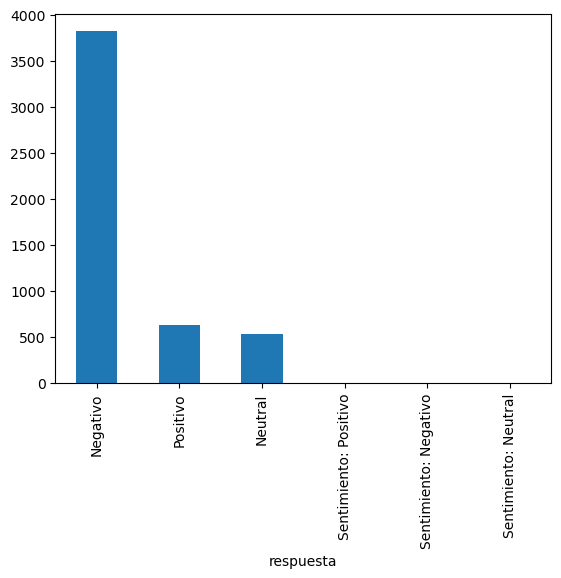

In [195]:
# graficar la cantidad de comentarios por sentimiento
bd['respuesta'].value_counts().plot(kind='bar')


**vemos que los resultados no fueron uniformes, se debe hacer una limpieza posteriormete**

# Creación de lotes para toda la base de datos

### **Creamos la lista de prompts**

In [4]:
prompts = [
    "Como IA con experiencia en análisis de lenguaje y emociones, su tarea es analizar el sentimiento del siguiente texto. Considere el tono general de la discusión, la emoción transmitida por el lenguaje utilizado y el contexto en el que se utilizan las palabras y frases. Indique si el sentimiento es generalmente positivo, negativo o neutral y proporcione una etiqueta sin ningún texto adicional.",
    "Realice la tarea de clasificación de sentimientos. Dado el texto, asigne una etiqueta de sentimiento entre positivo, negativo o neutral. Devuelva únicamente la etiqueta sin ningún otro texto.",
    "Indique si el sentimiento es generalmente positivo, negativo o neutral y proporcione una etiqueta sin ningún texto adicional. Considere el tono general de la discusión, la emoción transmitida por el lenguaje utilizado y el contexto en el que se utilizan las palabras y frases. Como IA con experiencia en análisis de lenguaje y emociones, su tarea es analizar el sentimiento del siguiente texto.",
    "Devuelva únicamente la etiqueta sin ningún otro texto. Realice la tarea de clasificación de sentimientos.  Dado el texto, asigne una etiqueta de sentimiento entre positivo, negativo o neutral.",
    "Como IA experto en procesamiento de lenguaje natural y análisis de sentimientos, su tarea es analizar el sentimiento del siguiente texto. Considere el tono general del comentario, los sentimientos transmitidos por el texto utilizado y el contexto en el que se utilizan las palabras y oraciones. Indique si el sentimiento es generalmente positivo, negativo o neutral y proporcione una etiqueta sin ningún texto adicional.",
    "Realice la tarea de clasificación de sentimientos. Dado el comentario, asigne una etiqueta de sentimiento entre positivo, negativo o neutral. Devuelva únicamente la etiqueta sin ningún otro texto.",
    "Como IA con experiencia en análisis de lenguaje y emociones, debes analizar el sentimiento del siguiente texto. Puedes considerar el tono general de la discusión, la emoción transmitida por el lenguaje utilizado y el contexto en el que se utilizan las palabras y frases. Tienes que indicar si el sentimiento es generalmente positivo, negativo o neutral y proporcione una etiqueta sin ningún texto adicional.",
    "Debes realizar la tarea de clasificación de sentimientos. Dado el texto, puedes asignar una etiqueta de sentimiento entre positivo, negativo o neutral. Tienes que devolver únicamente la etiqueta sin ningún otro texto."
]

### **Creamos la base de datos filtrada y también el balanceo estratíficado**

In [5]:
bd = pd.read_csv('data/complete/comentarios.csv')

In [77]:
# contar la cantidad de caracteres en cada comentario 
bd['caracteres'] = bd['Texto Comentario'].apply(lambda x: len(x))

In [78]:
bd = bd[bd['caracteres'] < bd['caracteres'].quantile(0.975)]

In [79]:
bd_filtered = bd

In [80]:
bd_filtered

,video_id,comment_id,Texto Comentario,likes,Tipo Comentaro,Nombre del Video,Link del Video,Fecha del Video,Nombre del noticiero,Query,País del Presidente,Tipo Noticiero,País del Medio,Nombre del Presidente,caracteres
0,hUB9Bbmh58I,UgxzYxtFuT8DX5IahFR4AaABAg,"No hablo de socialismo, que falacias que sacan",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,46
1,hUB9Bbmh58I,UgyMvKupk0keUaOWGeF4AaABAg,"Vé, una pregunta: ¿Cuando Petro habló de socia...",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,55
2,hUB9Bbmh58I,Ugzn5x-8V0cPAng1oYF4AaABAg,no entiendo porque quieren seguir vendiendo la...,0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,183
3,hUB9Bbmh58I,UgxXBXoLabae2Lb_vlB4AaABAg,"Selor Lucumi,Me gustaría aclarar que la postur...",0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,301
4,hUB9Bbmh58I,UgyLqVixbjXvEfZXKSR4AaABAg,JAJAJAJA ESE PETRO ES UN PAYASO...,0.0,principal,"Una región, dos posturas: en Davos, Milei y Pe...",https://www.youtube.com/watch?v=hUB9Bbmh58I,2024-01-18 01:53:49+00:00,France 24 Español,Argentina Javier Milei presidente,Argentina,Internacional,Internacional,Javier Milei,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
588500,KEUH4oKd1N0,Ugz9n49-qrnTLL-dhBF4AaABAg.A5SPkX9Z_ZlA5UtNbnraqw,"Será, por el teléfono o por el djdjwiwowbe ja...",1.0,reply,"Escándalo en Colombia: “Soy heterosexual”, dic...",https://www.youtube.com/watch?v=KEUH4oKd1N0,2024-07-04 01:15:01+00:00,Excélsior TV,Colombia Gustavo Petro presidente,México,Nacional,México,Andrés Manuel López Obrador,54
588501,KEUH4oKd1N0,Ugw9VVDlOJ_lj91JsBx4AaABAg,"Realidad de muchos, cogen hombres ricos pero s...",7.0,principal,"Escándalo en Colombia: “Soy heterosexual”, dic...",https://www.youtube.com/watch?v=KEUH4oKd1N0,2024-07-04 01:15:01+00:00,Excélsior TV,Colombia Gustavo Petro presidente,México,Nacional,México,Andrés Manuel López Obrador,95
588502,KEUH4oKd1N0,UgyEZZElbqo7A-024Jl4AaABAg,Un montaje totalmente Porque esos medios se va...,0.0,principal,"Escándalo en Colombia: “Soy heterosexual”, dic...",https://www.youtube.com/watch?v=KEUH4oKd1N0,2024-07-04 01:15:01+00:00,Excélsior TV,Colombia Gustavo Petro presidente,México,Nacional,México,Andrés Manuel López Obrador,124
588503,KEUH4oKd1N0,Ugw_EE7cruqg1axy0hl4AaABAg,Montaje.,4.0,principal,"Escándalo en Colombia: “Soy heterosexual”, dic...",https://www.youtube.com/watch?v=KEUH4oKd1N0,2024-07-04 01:15:01+00:00,Excélsior TV,Colombia Gustavo Petro presidente,México,Nacional,México,Andrés Manuel López Obrador,8


In [81]:
# Muestra estratificada balanceada por País del Medio

bd_filtered['País del Medio'].value_counts()


País del Medio
México           366376
Argentina        118135
Internacional     52115
Colombia          36613
El Salvador         544
Name: count, dtype: int64

In [82]:
# Calcular la frecuencia de cada país
country_counts = bd_filtered['País del Medio'].value_counts()
total_counts = country_counts.sum()

# Calcular la proporción de cada país en el conjunto de datos
country_proportions = country_counts / total_counts

# Determinar el número de muestras para cada país basado en las proporciones
samples_per_country = (country_proportions * 100000).round().astype(int)

In [83]:
samples_per_country

País del Medio
México           63853
Argentina        20589
Internacional     9083
Colombia          6381
El Salvador         95
Name: count, dtype: int64

In [85]:
# Calcular la frecuencia de cada país
country_counts = bd_filtered['País del Medio'].value_counts()
total_counts = country_counts.sum()

# Calcular la proporción de cada país en el conjunto de datos
country_proportions = country_counts / total_counts

# Determinar el número de muestras para cada país basado en las proporciones
samples_per_country = (country_proportions * 100000).round().astype(int)

# Ajustar las muestras para asegurar que la suma total sea exactamente 100,000
#  es necesario porque, al redondear los números de muestras para cada país a enteros, es posible que la suma de todas las muestras no sea exactamente 100,000 debido a la pérdida de precisión en el redondeo.

difference = 100000 - samples_per_country.sum()
if difference != 0:
    samples_per_country.iloc[0] += difference  # Ajustar en el país con más muestras
    print(f"Se ajustó el número de muestras para el país {samples_per_country.index[0]}")

# Crear la muestra balanceada
balanced_sample = pd.DataFrame()  # DataFrame vacío para almacenar los resultados

for country, n_samples in samples_per_country.items():
    if n_samples > 0:  # Solo tomar muestras si el número es mayor que cero
        # Tomar una muestra aleatoria de comentarios para el país actual
        sample = bd_filtered[bd_filtered['País del Medio'] == country].sample(n=n_samples, replace=False)
        # Agregar la muestra al DataFrame balanceado
        balanced_sample = pd.concat([balanced_sample, sample], ignore_index=True)


Se ajustó el número de muestras para el país México


In [86]:
balanced_sample["País del Medio"].value_counts()

País del Medio
México           63852
Argentina        20589
Internacional     9083
Colombia          6381
El Salvador         95
Name: count, dtype: int64

In [87]:
# graficar la cantidad de comentarios por sentimiento con plotly
import plotly.express as px

fig = px.bar(balanced_sample['País del Medio'].value_counts(), title='Cantidad de comentarios por país del medio')
fig.show()

**almacenamos la base de datos balanceada**

In [ ]:
balanced_sample.to_csv('data/complete/comentarios_balanceado.csv', index=False)

### **Creación de los dfs de 10.000**

In [8]:
balanced_sample = pd.read_csv('data/complete/comentarios_balanceado.csv')

In [9]:
# Dividir la base de datos en lotes de 10,000 o menos
batch_size = 10000
dfs = [balanced_sample.iloc[i:i + batch_size] for i in range(0, len(balanced_sample), batch_size)]

# Ahora dfs es una lista de DataFrames, cada uno con un máximo de 50,000 filas
for idx, df in enumerate(dfs):
    print(f"Lote {idx + 1}: {len(df)}")

Lote 1: 10000
Lote 2: 10000
Lote 3: 10000
Lote 4: 10000
Lote 5: 10000
Lote 6: 10000
Lote 7: 10000
Lote 8: 10000
Lote 9: 10000
Lote 10: 10000


In [10]:
# todos los cuartiles 
balanced_sample['caracteres'].describe()

count    100000.000000
mean         95.843800
std          83.319527
min           1.000000
25%          36.000000
50%          70.000000
75%         129.000000
max         450.000000
Name: caracteres, dtype: float64

**Crear los archivos del batch con la muestra balanceada**

In [11]:
import json
import os

for idx, df in enumerate(dfs):
    comments = df["Texto Comentario"].tolist()
    
    for prompt_idx, prompt in enumerate(prompts):
        # Nombre del archivo de salida
        input_filename = f'data/batches/prompt{prompt_idx + 1}/input_comments_batch_{idx + 1}.jsonl'
        
        # Crear directorio si no existe
        os.makedirs(os.path.dirname(input_filename), exist_ok=True)
        
        # Abrir y escribir en el archivo JSONL con codificación UTF-8
        with open(input_filename, 'w', encoding='utf-8') as jsonl_file:
            for i, comment in enumerate(comments, start=1):
                request_data = {
                    "custom_id": f"request-{i}",
                    "method": "POST",
                    "url": "/v1/chat/completions",
                    "body": {
                        "model": "gpt-4o-mini",
                        "temperature": 0,
                        "messages": [
                            {"role": "system", "content": prompt},
                            {"role": "user", "content": comment}
                        ],
                        "max_tokens": 1000
                    }
                }
                jsonl_file.write(json.dumps(request_data, ensure_ascii=False) + '\n')
        
        print(f"Archivo JSONL creado para el lote {idx + 1} y el prompt {prompt_idx + 1}.")

print("Archivos JSONL creados correctamente.")

Archivo JSONL creado para el lote 1 y el prompt 1.
Archivo JSONL creado para el lote 1 y el prompt 2.
Archivo JSONL creado para el lote 1 y el prompt 3.
Archivo JSONL creado para el lote 1 y el prompt 4.
Archivo JSONL creado para el lote 1 y el prompt 5.
Archivo JSONL creado para el lote 1 y el prompt 6.
Archivo JSONL creado para el lote 1 y el prompt 7.
Archivo JSONL creado para el lote 1 y el prompt 8.
Archivo JSONL creado para el lote 2 y el prompt 1.
Archivo JSONL creado para el lote 2 y el prompt 2.
Archivo JSONL creado para el lote 2 y el prompt 3.
Archivo JSONL creado para el lote 2 y el prompt 4.
Archivo JSONL creado para el lote 2 y el prompt 5.
Archivo JSONL creado para el lote 2 y el prompt 6.
Archivo JSONL creado para el lote 2 y el prompt 7.
Archivo JSONL creado para el lote 2 y el prompt 8.
Archivo JSONL creado para el lote 3 y el prompt 1.
Archivo JSONL creado para el lote 3 y el prompt 2.
Archivo JSONL creado para el lote 3 y el prompt 3.
Archivo JSONL creado para el lo

### **Batchs Automatizados**

In [12]:
import pandas as pd
import json

**Función para procesar la respuesta de json**

In [13]:
def procesar_respuestas(file_response):
    # Leer el contenido del archivo como texto
    file_content = file_response.text
    
    # Convertir cada línea del archivo JSONL en un diccionario
    lines = file_content.splitlines()
    responses = [json.loads(line) for line in lines]
    
    # Extraer la respuesta del asistente
    assistant_responses = [
        response['response']['body']['choices'][0]['message']['content'] 
        for response in responses
    ]
    
    # Crear un DataFrame con las respuestas en una columna
    df_respuestas = pd.DataFrame(assistant_responses, columns=['respuesta'])
    
    # Mostrar el DataFrame
    return df_respuestas

**Función para correr prompts de forma independiente**

In [ ]:
import time

# Suponiendo que 'prompts' es una lista de los textos de los prompts
prompt = prompts[0]  # Selecciona el primer prompt
prompt_idx = i  # Índice del primer prompt

# Establecer el índice de inicio, establecer a 0 para procesar todos desde el principio
start_index = 9

# Usar 'start_index' para definir el inicio del bucle
for idx, df in enumerate(dfs[start_index:], start=start_index):

    # Nombre del archivo de entrada basado en el primer prompt y el lote
    input_filename = f'data/batches/prompt{prompt_idx + 1}/input_comments_batch_{idx + 1}.jsonl'
    
    # Subir el archivo a OpenAI
    batch_input_file = client.files.create(
        file=open(input_filename, "rb"),
        purpose="batch"
    )
    batch_input_file_id = batch_input_file.id

    # Crear un lote de procesamiento
    batch_process = client.batches.create(
        input_file_id=batch_input_file_id,
        endpoint="/v1/chat/completions",
        completion_window="24h",
        metadata={"description": f"prompt{prompt_idx + 1}.final"}
    )
    batch_id = batch_process.id

    print(f"Lote {idx + 1} y prompt {prompt_idx + 1} creado.")
    print(f"ID del lote: {batch_id}")

    # Esperar a que el lote se confirme que está en proceso
    while True:
        status = client.batches.retrieve(batch_id).status
        if status == "processing":
            print(f"El lote {idx + 1} y el prompt {prompt_idx + 1} está en proceso.")
            break
        elif status not in ["queued", "processing"]:
            print(f"El lote {idx + 1} y el prompt {prompt_idx + 1} ha fallado o sido cancelado en la etapa de inicio.")
            break
        time.sleep(10)  # Espera 10 segundos antes de comprobar de nuevo

    # Esperar a que el lote se complete
    while True:
        status = client.batches.retrieve(batch_id).status
        if status == "completed":
            # si el lote se ha completado, procesar las respuestas
            file_response_t = client.batches.retrieve(batch_id).output_file_id  # se obtiene el id del archivo de salida
            file_response = client.files.content(file_response_t)
            df_respuestas = procesar_respuestas(file_response)  # Asegúrate de que esta función retorne un DataFrame
            print(f"Respuestas procesadas para el lote {idx + 1} y el prompt {prompt_idx + 1}.")
            df_respuestas.to_csv(f'data/batches/prompt{prompt_idx + 1}/results2/batch_{idx + 1}_with_responses.csv', index=False)
            break
        elif status in ["failed", "cancelled"]:
            print(f"El lote {idx + 1} y el prompt {prompt_idx + 1} ha fallado o sido cancelado.")
            break
        time.sleep(100)  # Espera 100 segundos antes de comprobar de nuevo

print("Procesamiento de respuestas completado.")

**Función que corre todos los prompts desde un indice específico** (Tamabien permite modificar el punto de inicio)

In [20]:
api_key = "API KEY"

In [ ]:
import json
import os
import time

# Suponiendo que 'prompts' es una lista de los textos de los prompts
start_index = 8  # Establecer el índice de inicio para los DataFrame

# Iniciar iteración sobre los prompts desde el índice 1 (que corresponde al segundo prompt)
for prompt_idx, prompt in enumerate(prompts[6:], start=6): 
    
    # Iterar sobre cada DataFrame a partir del índice de inicio
    for idx, df in enumerate(dfs[start_index:], start=start_index):
        
        # Nombre del archivo de entrada basado en el prompt y el lote
        input_filename = f'data/batches/prompt{prompt_idx + 1}/input_comments_batch_{idx + 1}.jsonl'
        
        # Crear la carpeta 'results2' si no existe
        results_dir = f'data/batches/prompt{prompt_idx + 1}/results2'
        os.makedirs(results_dir, exist_ok=True)
        
        # Subir el archivo a OpenAI
        batch_input_file = client.files.create(
            file=open(input_filename, "rb"),
            purpose="batch"
        )
        batch_input_file_id = batch_input_file.id

        # Crear un lote de procesamiento
        batch_process = client.batches.create(
            input_file_id=batch_input_file_id,
            endpoint="/v1/chat/completions",
            completion_window="24h",
            metadata={"description": f"prompt{prompt_idx + 1}.final"}
        )
        batch_id = batch_process.id

        print(f"Lote {idx + 1} y prompt {prompt_idx + 1} creado.")
        print(f"ID del lote: {batch_id}")

        # Esperar a que el lote se confirme que está en proceso
        while True:
            status = client.batches.retrieve(batch_id).status
            if status == "processing":
                print(f"El lote {idx + 1} y el prompt {prompt_idx + 1} está en proceso.")
                break
            elif status not in ["queued", "processing"]:
                print(f"El lote {idx + 1} y el prompt {prompt_idx + 1} ha fallado o sido cancelado en la etapa de inicio.")
                break
            time.sleep(10)  # Espera 10 segundos antes de comprobar de nuevo

        # Esperar a que el lote se complete
        while True:
            status = client.batches.retrieve(batch_id).status
            if status == "completed":
                # si el lote se ha completado, procesar las respuestas
                file_response_t = client.batches.retrieve(batch_id).output_file_id  # se obtiene el id del archivo de salida
                file_response = client.files.content(file_response_t)
                df_respuestas = procesar_respuestas(file_response)  # Asegúrate de que esta función retorne un DataFrame
                print(f"Respuestas procesadas para el lote {idx + 1} y el prompt {prompt_idx + 1}.")
                
                # Guardar las respuestas en la carpeta 'results2'
                df_respuestas.to_csv(f'{results_dir}/batch_{idx + 1}_with_responses.csv', index=False)
                break
            elif status in ["failed", "cancelled"]:
                print(f"El lote {idx + 1} y el prompt {prompt_idx + 1} ha fallado o sido cancelado.")
                break
            time.sleep(100)  # Espera 100 segundos antes de comprobar de nuevo

print("Procesamiento de respuestas completado.")

### **Si se necesita consultar un archivo manualmemte**

In [ ]:
# acceder al objeto del status del batch
client.batches.retrieve("batch_dsVyYznYRGLG5NK0cu9nBtYg").output_file_id

'file-SCtNinWSy5WCE4Wg51lKg1N8'

In [ ]:
file_response = client.files.content("file-zdnTtODFXB9S4Rj1Fe144Oyu")
print(file_response.text)

{"id": "batch_req_7IS2IsFu1yMySWHMpxYaWtYk", "custom_id": "request-1", "response": {"status_code": 200, "request_id": "e549e8584398db790f8a8b3d0ac050cb", "body": {"id": "chatcmpl-A2zeoNsyBUvT9d6JBblYBOVoSpj5c", "object": "chat.completion", "created": 1725277030, "model": "gpt-4o-mini-2024-07-18", "choices": [{"index": 0, "message": {"role": "assistant", "content": "negativo", "refusal": null}, "logprobs": null, "finish_reason": "stop"}], "usage": {"prompt_tokens": 70, "completion_tokens": 2, "total_tokens": 72}, "system_fingerprint": "fp_f33667828e"}}, "error": null}
{"id": "batch_req_A8ektww6scrbLtvubwK0OOgP", "custom_id": "request-2", "response": {"status_code": 200, "request_id": "51fc744b66911687b02ad3df6ec3c747", "body": {"id": "chatcmpl-A2zeonNh89ujv90pgxkB69lXWZpdp", "object": "chat.completion", "created": 1725277030, "model": "gpt-4o-mini-2024-07-18", "choices": [{"index": 0, "message": {"role": "assistant", "content": "positivo", "refusal": null}, "logprobs": null, "finish_rea

In [ ]:
respuestas = procesar_respuestas(file_response)

In [ ]:
respuestas

,respuesta
0,negativo
1,positivo
2,Negativo
3,negativo
4,negativo
...,...
9995,neutral
9996,neutral
9997,negativo
9998,positivo


In [ ]:
respuestas.to_csv('data/batches/prompt4/results2/batch_10_with_responses.csv', index=False)